In [1]:
%reload_ext autoreload 
%autoreload 2
%matplotlib inline
import matplotlib.pyplot as plt
from strauss.sonification import Sonification
from strauss.sources import Objects, Events
from strauss import channels
from strauss.score import Score
from strauss.generator import Synthesizer, Spectralizer, Sampler
from strauss import sources as Sources

import IPython.display as ipd
import os
from scipy.interpolate import interp1d
import numpy as np
import requests

# modules to display in-notebook
import IPython.display as ipd
from IPython.display import display, Markdown, Latex, Image


In [2]:
import pandas as pd
import scipy
dframe = pd.read_csv('./manga/manga_7443_12703_path_props.csv')

FileNotFoundError: [Errno 2] No such file or directory: './manga/manga_7443_12703_path_props.csv'

In [3]:
def prepare_data(cols):
    dat = []
    print (cols)
    for c in cols[1:]:
        y = dframe[c].values
        y = scipy.ndimage.gaussian_filter1d(y,y.size/200)
        y = (y - y.min())/(y.max()-y.min())
        dat.append(y)
    return np.column_stack(dat)

## Pitch Map

pitch_mapper:
preset for mapping pitch_shift for 1D data sonification. the single triangle wave oscillator provides a balance between harmonic richness and the harshness of the sound to allow clear audiability over a large pitch range.



100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 29.79it/s]


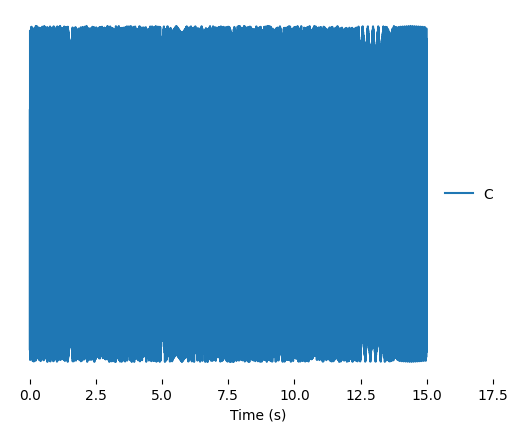

In [4]:
# set an index to truncate the lightcurve (if it's too long...)
N = None

y = dframe['stellar_vel'].values
y = scipy.ndimage.gaussian_filter1d(y,y.size/200)
x = np.linspace(0,1, y.size)


notes = [["A2"]]
score =  Score(notes, 15)

# set up synth (this generates the sound using mathematical waveforms)
generator = Synthesizer()
generator.preset_details('pitch_mapper')
generator.load_preset('pitch_mapper')


data = {'pitch':1.,
        'time_evo':x,
        'pitch_shift':y}

# set 0 to 100 percentile limits so the full pitch and time range is used...
lims = {'time_evo': ('0','100'),
        'pitch_shift': ('0','100')}

# set up source
sources = Objects(data.keys())
sources.fromdict(data)
sources.apply_mapping_functions(map_lims=lims)

soni = Sonification(score, sources, generator, 'mono')
soni.render()
dobj = soni.notebook_display(show_waveform=1);

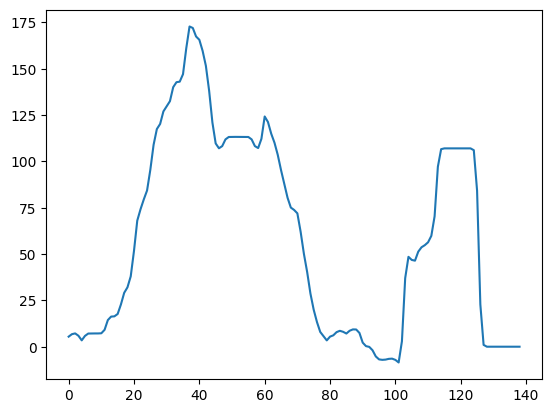

In [5]:
plt.plot(y)

## Timbre Map

In [6]:
generator = Synthesizer()
generator.modify_preset({'filter':'on'})

# uncomment these lines to try a 'textural' sonification using white noise! ✏️
# generator.load_preset('windy')
# generator.preset_details('windy')

# we use a 'chord' here to create more harmonic richness (stacking fifths)...
notes = [["A2", "E3", 'B3', 'F#4']]
score =  Score(notes, 15)

data = {'pitch':[0,1,2,3],
        'time_evo':[x]*4,
        'cutoff':[y]*4}

lims = {'time_evo': ('0','100'),
        'cutoff': ('0','100')}

# set up source
sources = Objects(data.keys())
sources.fromdict(data)
plims = {'cutoff': (0.15,0.95)}
sources.apply_mapping_functions(map_lims=lims, param_lims=plims)

soni = Sonification(score, sources, generator, 'mono')
soni.render()
dobj = soni.notebook_display(show_waveform=0);

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00,  9.93it/s]


In [7]:
props = prepare_data(dframe.columns)

Index(['time', 'x', 'y', 'stellar_vel', 'stellar_sigma', 'emline_ha',
       'emline_hb', 'emline_oiii4960', 'emline_oiii5008', 'timedelta'],
      dtype='object')


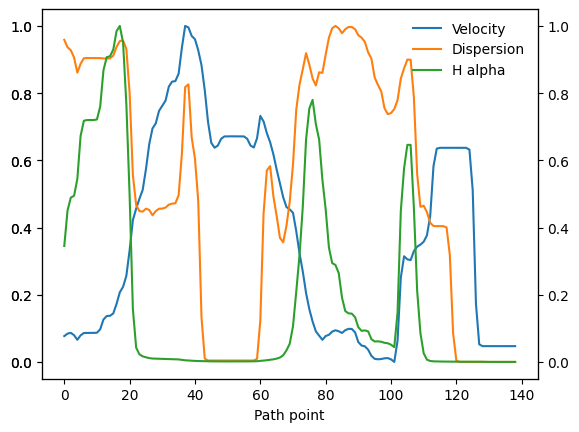

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00,  9.04it/s]


Saved soni2.wav


In [8]:
y = dframe['stellar_vel'].values
y = scipy.ndimage.gaussian_filter1d(y,y.size/200)

# A list of some 'evolvable' mappings
some_mappings = ["pitch_shift",
                 "cutoff",
                 "volume",
                 "phi",
                 "volume_lfo/amount", 
                 "volume_lfo/freq_shift",
                 "pitch_lfo/amount", 
                 "pitch_lfo/freq_shift"]

# !! change these (between 0 and 7) to select a different property to map... 
idx_a = 0
idx_b = 4
idx_c = 1

chosen = [some_mappings[idx_a],some_mappings[idx_b]]

# use a stereo system to allow 'phi' mapping (low pan left and high pan right)
system = "stereo"

# some strauss setup can happen outside the loop...
generator = Synthesizer()

generator = Synthesizer()
generator.modify_preset({'filter':'on',
                         "pitch_hi":-1, "pitch_lo": 1,
                         "pitch_lfo": {"use": "on", 
                                       "amount":1*("pitch_lfo/freq_shift" in chosen), 
                                       "freq":3*5**("pitch_lfo/freq_shift" not in chosen), 
                                       "phase":0.25},
                         "volume_lfo": {"use": "on", 
                                        "amount":1*("volume_lfo/freq_shift" in chosen), 
                                        "freq":3*5**("volume_lfo/freq_shift" not in chosen), 
                                        "phase":0}
                        })


notes = [["A2", "E3"]]
score =  Score(notes, 13.32)

lims = {'time_evo': ('0','100'),
        'pitch_shift': ('0','100'),
        'cutoff': ('0','100'),
        "volume": ('0','100'), 
        "phi": (-0.5,1.5),
        "volume_lfo/amount": ('0','100'), 
        "volume_lfo/freq_shift": ('0','100'),
        "pitch_lfo/amount": ('0','100'), 
        "pitch_lfo/freq_shift": ('0','100')}


# plot multivariate data ------------------------ 
plt.plot(props[:,2], label='Velocity')
plt.xlabel(f'Path point')
# plt.ylabel(f'Star Velocity ')
plt.gca().twinx()
plt.plot([0],[0], label='Velocity') # dummy plot to make legend work
plt.plot(props[:,3],c='C1',label="Star Dispersion")
# plt.xlabel(f'Time [Gyr]')
# plt.ylabel(f'Metallicity')
plt.gca().twinx()
plt.plot([0],[0], label='Velocity')
plt.plot([0],[0], label='Dispersion') # dummy plot to make legend work
plt.plot(props[:,4],c='C2',label="H alpha")
plt.legend(frameon=0)
plt.show();
# ------------------------------------------------ 



data = {'pitch':[0,1],
      'time_evo':[np.linspace(0,1, props.shape[0])]*2,
      'theta':[0.5]*2,
      'volume':[(props[:,4]!=0).astype(float)]*2,
      'pitch_shift':[props[:,2]]*2,
      'volume_lfo/amount':[props[:,3]]*2,
      #'cutoff':[props[:,2]]*2
       }

# set up source
sources = Objects(data.keys())
sources.fromdict(data)
plims = {'cutoff': (0.5,1)}
sources.apply_mapping_functions(map_lims=lims, param_lims=plims)

soni = Sonification(score, sources, generator, system)
soni.render()
dobj = soni.notebook_display(show_waveform=0)
soni.save('soni2.wav', master_volume=0.8)

In [81]:
2

2

In [55]:
%pip install ffmpeg

Defaulting to user installation because normal site-packages is not writeable
  Preparing metadata (setup.py) ... done
  Created wheel for ffmpeg: filename=ffmpeg-1.4-py3-none-any.whl size=6082 sha256=31147014e2bb3b1280a44a95666c3ec1e18cf91e4b13f5c9af2af1f221b52896
  Stored in directory: /media/home/.cache/pip/wheels/56/30/c5/576bdd729f3bc062d62a551be7fefd6ed2f761901568171e4e
Successfully built ffmpeg
Note: you may need to restart the kernel to use updated packages.


In [57]:
%pip uninstall ffmpeg -y

Found existing installation: ffmpeg 1.4
Uninstalling ffmpeg-1.4:
  Successfully uninstalled ffmpeg-1.4
Note: you may need to restart the kernel to use updated packages.


In [7]:
balm = props[:,5]/props[:,4]
isnan = np.isnan(balm)
balm[isnan] = balm[~isnan].min()
balm

/var/folders/h5/_7t3w06172n0tvb5jh4ghntc0000gn/T/ipykernel_43236/801866720.py:1: RuntimeWarning: invalid value encountered in divide
  balm = props[:,5]/props[:,4]


array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.08640995, 0.13694013, 0.19971423, 0.2895264 ,
       0.41844492, 0.59929431, 0.83932963, 1.12434922, 1.40104137,
       1.59226885, 1.66090812, 1.64440098, 1.60704803, 1.5842615 ,
       1.57750759, 1.57729629, 1.57795548, 1.5782453 , 1.57831238,
       1.57832511, 1.57834929, 1.57851772, 1.5793788 , 1.58246614,
       1.59039777, 1.60577863, 1.63078782, 1.66849454, 1.71985125,
       1.77536325, 1.81523472, 1.82190291, 1.78766754, 1.71361219,
       1.6162003 , 1.54022858, 1.54643316, 1.66056092, 1.83900837,
       2.01096141, 2.15240563, 2.29997426, 2.49985218, 2.74653307,
       2.97549963, 3.13361267, 3.2259579 , 3.28941184, 3.34116997,
       3.3428866 , 3.21516403, 2.90416461, 2.44317636, 1.94059914,
       1.50866798, 1.20082895, 0.9969526 , 0.84736754, 0.73192